<a href="https://colab.research.google.com/github/chitra-psg/nlp_ner/blob/main/Assignment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Identifying Entities in Healthcare Data

##Workspace set up: Import and Install useful packages.

In [4]:
!pip install pycrf
!pip install sklearn-crfsuite

import spacy
import sklearn_crfsuite
from sklearn_crfsuite import metrics
from collections import Counter
import pathlib
import os
from google.colab import drive

model = spacy.load("en_core_web_sm")

In [5]:
# Setting up Google Colab for usage. Please disable if running locally.
drive.mount('/content/gdrive')
base_dir = pathlib.Path('/content/gdrive/My Drive/clinical_data')
os.chdir(str(base_dir))

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


##Data Preprocessing

The dataset provided is in the form of one word per line. Let's understand the format of data below:
- Suppose there are *x* words in a sentence, then there will be *x* continuous lines with one word in each line.
- Further, the two sentences are separated by empty lines. The labels for the data follow the same format.

**We need to pre-process the data to recover the complete sentences and their labels.**


### Construct the proper sentences from individual words and print the 5 sentences.

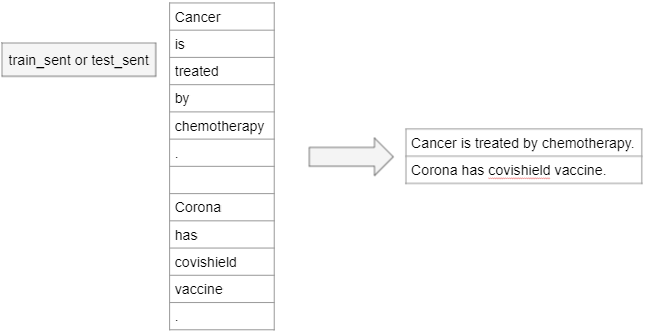

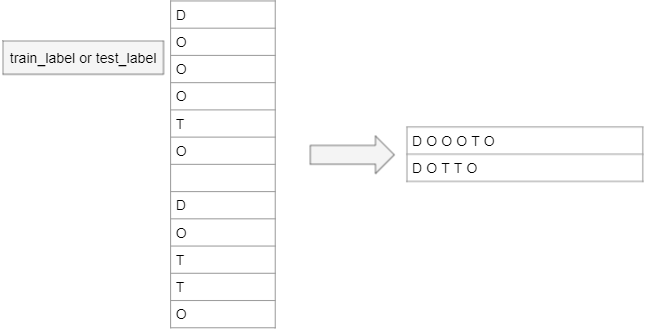

In [6]:
def read_file(file_name):
  input_file = open(file_name, 'r')
  file_content = input_file.readlines()
  input_file.close()

  out_sents = [] #To store list of sequences (sentences or labels)

  line_content = ""

  for word in file_content:
    word = word.strip()
    if word == "": # If empty line, add the current sequence to out_lines
      out_sents.append(line_content)
      line_content = ""; # re-initialize
    else:
      if line_content: #if non-empty, add new word after space
        line_content = line_content + " " + word
      else:
        line_content = word # first word, no space required

  return out_sents


In [7]:

train_sentences = read_file('train_sent')
train_labels = read_file('train_label')
test_sentences = read_file('test_sent')
test_labels = read_file('test_label')

In [8]:
# Print the 5 sentences from the processed dataset
for i in range(5):
  print("Sentence:", train_sentences[i])
  print("Labels:", train_labels[i], "\n\n")

Sentence: All live births > or = 23 weeks at the University of Vermont in 1995 ( n = 2395 ) were retrospectively analyzed for delivery route , indication for cesarean , gestational age , parity , and practice group ( to reflect risk status )
Labels: O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O 


Sentence: The total cesarean rate was 14.4 % ( 344 of 2395 ) , and the primary rate was 11.4 % ( 244 of 2144 )
Labels: O O O O O O O O O O O O O O O O O O O O O O O O O 


Sentence: Abnormal presentation was the most common indication ( 25.6 % , 88 of 344 )
Labels: O O O O O O O O O O O O O O O 


Sentence: The `` corrected '' cesarean rate ( maternal-fetal medicine and transported patients excluded ) was 12.4 % ( 273 of 2194 ) , and the `` corrected '' primary rate was 9.6 % ( 190 of 1975 )
Labels: O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O 


Sentence: Arrest of dilation was the most common indication in both `` co

### Count the number of sentences in the processed train and test dataset

In [9]:
print("No. of lines in train_sentences:", len(train_sentences))
print("No. of lines in test_sentences:", len(test_sentences))

No. of lines in train_sentences: 2599
No. of lines in test_sentences: 1056


### Count the number of lines of labels in the processed train and test dataset.

In [10]:

# The lengths of the four variables should match the below output
print("No. of lines in train_labels:", len(train_labels))
print("No. of lines in test_labels:", len(test_labels))

# Count matches with the numbers in problem statement

No. of lines in train_labels: 2599
No. of lines in test_labels: 1056


##Concept Identification

We will first explore what are the various concepts present in the dataset. For this, we will use PoS Tagging.



### Extract those tokens which have NOUN or PROPN as their PoS tag and find their frequency

In [11]:
concepts = {}

for sentences in (train_sentences, test_sentences):
  for sentence in sentences:
    processed_sentence = model(sentence) # Process each sentence by spacy model
    for token in processed_sentence:
      if(token.pos_ == 'NOUN' or token.pos_ == 'PROPN'): #check if the token is a noun
        concepts[token.text] = concepts.get(token.text, 0) + 1; #increase its frequency if it is noun

### Print the top 25 most common tokens with NOUN or PROPN PoS tags

In [12]:

concept_counter = Counter(concepts)
concept_counter.most_common(25)

[('patients', 492),
 ('treatment', 281),
 ('%', 247),
 ('cancer', 200),
 ('therapy', 175),
 ('study', 154),
 ('disease', 142),
 ('cell', 140),
 ('lung', 116),
 ('group', 94),
 ('chemotherapy', 88),
 ('gene', 87),
 ('effects', 85),
 ('results', 79),
 ('women', 77),
 ('use', 74),
 ('TO_SEE', 74),
 ('risk', 71),
 ('cases', 71),
 ('surgery', 71),
 ('analysis', 70),
 ('rate', 67),
 ('response', 66),
 ('survival', 65),
 ('children', 64)]

## Defining features for CRF





In [13]:
# Let's define the features to get the feature value for one word.
def GetWordFeatures(sentence, pos, pos_tags):
  word = sentence[pos]

  #Define 12 features with PoS tag as one of the features
  features = [
    'word.lower=' + word.lower(), # serves as word id
    'word[-3:]=' + word[-3:],     # last three characters
    'word[-2:]=' + word[-2:],     # last two characters
    'word.isupper=%s' % word.isupper(),  # is the word in all uppercase
    'word.isdigit=%s' % word.isdigit(),  # is the word a number
    'word.startsWithCapital=%s' % word[0].isupper(), # is the word starting with a capital letter
    'word.pos=' + pos_tags[pos]
  ]

  #Use the previous word also while defining features
  if(pos > 0):
    prev_word = sentence[pos-1]
    features.extend([
    'prev_word.lower=' + prev_word.lower(),
    'prev_word.isupper=%s' % prev_word.isupper(),
    'prev_word.isdigit=%s' % prev_word.isdigit(),
    'prev_word.startsWithCapital=%s' % prev_word[0].isupper(),
    'prev_word.pos=' + pos_tags[pos-1]
  ])
  # Mark the begining and the end words of a sentence correctly in the form of features.
  else:
    features.append('BEG') # feature to track begin of sentence

  if(pos == len(sentence)-1):
    features.append('END') # feature to track end of sentence

  return features

## Getting the features

### Write a code/function to get the features for a sentence

In [14]:
# Write a code to get features for a sentence.
# Define a function to get features for a sentence using the 'getFeaturesForOneWord' function.
def GetSentenceFeatures(sentence):

  processed_sentence = model(sentence) #spacy is applied to sentence

  pos_tags = [] #correctly identify pos tags
  for token in processed_sentence:
    pos_tags.append(token.pos_)

  sentence_list = sentence.split() # List of words in sentence

  #Correctly calling getFeaturesForOneWord defined above
  return [GetWordFeatures(sentence_list, pos, pos_tags) for pos in range(len(sentence_list))]


### Write a code/function to get the labels of a sentence

In [15]:
# Write a code to get the labels for a sentence.
def GetSentenceLabels(labels):
  return labels.split()

## Define input and target variables


Correctly computing X and Y sequence matrices for training and test data.
Check that both sentences and labels are processed

### Define the features' values for each sentence as input variable  for CRF model in test and the train dataset

In [16]:

X_train = [GetSentenceFeatures(sentence) for sentence in train_sentences]
X_test = [GetSentenceFeatures(sentence) for sentence in test_sentences]

In [35]:
X_train

[[['word.lower=all',
   'word[-3:]=All',
   'word[-2:]=ll',
   'word.isupper=False',
   'word.isdigit=False',
   'word.startsWithCapital=True',
   'word.pos=DET',
   'BEG'],
  ['word.lower=live',
   'word[-3:]=ive',
   'word[-2:]=ve',
   'word.isupper=False',
   'word.isdigit=False',
   'word.startsWithCapital=False',
   'word.pos=ADJ',
   'prev_word.lower=all',
   'prev_word.isupper=False',
   'prev_word.isdigit=False',
   'prev_word.startsWithCapital=True',
   'prev_word.pos=DET'],
  ['word.lower=births',
   'word[-3:]=ths',
   'word[-2:]=hs',
   'word.isupper=False',
   'word.isdigit=False',
   'word.startsWithCapital=False',
   'word.pos=NOUN',
   'prev_word.lower=live',
   'prev_word.isupper=False',
   'prev_word.isdigit=False',
   'prev_word.startsWithCapital=False',
   'prev_word.pos=ADJ'],
  ['word.lower=>',
   'word[-3:]=>',
   'word[-2:]=>',
   'word.isupper=False',
   'word.isdigit=False',
   'word.startsWithCapital=False',
   'word.pos=X',
   'prev_word.lower=births',
   'p

### Define the labels as the target variable for test and the train dataset

In [17]:
Y_train = [GetSentenceLabels(labels) for labels in train_labels]
Y_test = [GetSentenceLabels(labels) for labels in test_labels]


In [22]:
!pip install --upgrade sklearn-crfsuite


In [27]:
!pip install scikit-learn==0.22.2 --user

ERROR: Could not find a version that satisfies the requirement scikit-learn==0.22.2 (from versions: 0.9, 0.10, 0.11, 0.12, 0.12.1, 0.13, 0.13.1, 0.14, 0.14.1, 0.15.0, 0.15.1, 0.15.2, 0.16.0, 0.16.1, 0.17, 0.17.1, 0.18, 0.18.1, 0.18.2, 0.19.0, 0.19.1, 0.19.2, 0.20.0, 0.20.1, 0.20.2, 0.20.3, 0.20.4, 0.21.1, 0.21.2, 0.21.3, 0.22, 0.22.1, 0.22.2.post1, 0.23.0, 0.23.1, 0.23.2, 0.24.0, 0.24.1, 0.24.2, 1.0, 1.0.1, 1.0.2, 1.1.0, 1.1.1, 1.1.2, 1.1.3, 1.2.0rc1, 1.2.0, 1.2.1, 1.2.2, 1.3.0rc1, 1.3.0)
ERROR: No matching distribution found for scikit-learn==0.22.2


## Build the CRF Model

In [31]:
import sklearn_crfsuite
from sklearn_crfsuite import metrics
from sklearn.metrics import classification_report

try:
    # Build the CRF model.
    crf = sklearn_crfsuite.CRF(max_iterations=100)

    # Check that only X_train and Y_train are passed
    crf.fit(X_train, Y_train)

    # Evaluate the model on a test dataset and print the classification report
  #  Y_pred = crf.predict(X_test)
  #  report = classification_report(Y_test, Y_pred)

   # print(report)

except Exception as e:
    print("An error occurred:", str(e))


## Evaluation

### Predict the labels of each of the tokens in each sentence of the test dataset that has been pre processed earlier.

In [32]:
Y_pred = crf.predict(X_test)

### Calculate the f1 score using the actual labels and the predicted labels of the test dataset.

In [33]:
metrics.flat_f1_score(Y_test, Y_pred, average='weighted')

0.9084959826402575

##Identifying Diseases and Treatments using Custom NER

We now use the CRF model's prediction to prepare a record of diseases identified in the corpus and treatments used for the diseases.



### Create the logic to get all the predicted treatments (T) labels corresponding to each disease (D) label in the test dataset.

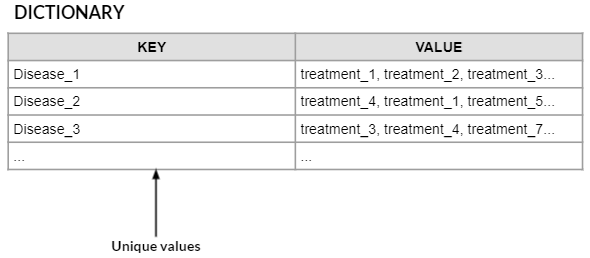

In [21]:
diseases_and_treatments =  {} # dictionary with disease as key an list of treatments as value

for i in range(len(Y_pred)): # For each predicted sequence
  labels = Y_pred[i]

  disease = "";
  treatment = "";

  for j in range(len(labels)): # for each individual label in the sequence
    if labels[j] == 'O': # ignore if label is O -- other
      continue

    if(labels[j] == 'D'): # Label D indicates disease, so add the corresponding word from test sentence to the disease name string
      disease += test_sentences[i].split()[j] + " "
      continue

    if(labels[j] == 'T'): # Label T indicates disease, so add the corresponding word from test sentence to the treatment name string
      #print(test_sentences[i].split()[j])
      treatment += test_sentences[i].split()[j] + " "

  disease = disease.strip() # to remove extraneous spaces
  treatment = treatment.strip()

  # add the identified disease and treatment to the dictionary
  # if it is a new disease, directly add the value
  # if the disease has been seen previously, get the treatment list
  # and add current treatment to the list.
  if disease is not "" and treatment is not "":
    if disease not in diseases_and_treatments.keys():
      diseases_and_treatments[disease] = [treatment]
    else:
      treatment_list = diseases_and_treatments.get(disease)
      treatment_list.append(treatment)
      diseases_and_treatments[disease] = treatment_list

<>:28: SyntaxWarning: "is not" with a literal. Did you mean "!="?
<>:28: SyntaxWarning: "is not" with a literal. Did you mean "!="?
<>:28: SyntaxWarning: "is not" with a literal. Did you mean "!="?
<>:28: SyntaxWarning: "is not" with a literal. Did you mean "!="?
<ipython-input-21-4c443ea78158>:28: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if disease is not "" and treatment is not "":
<ipython-input-21-4c443ea78158>:28: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if disease is not "" and treatment is not "":


In [36]:
diseases_and_treatments

{'hereditary retinoblastoma': ['radiotherapy'],
 'myocardial infarction': ['warfarin with 80 mg aspirin , or 1 mg warfarin with 80 mg aspirin'],
 'unstable angina': ['roxithromycin'],
 'primary pulmonary hypertension ( PPH )': ['fenfluramines'],
 'foot infection': ['G-CSF treatment'],
 "early Parkinson 's disease": ['Ropinirole monotherapy'],
 'abdominal tuberculosis': ['steroids'],
 'female stress urinary incontinence': ['surgical treatment'],
 'stress urinary incontinence': ['surgery as initial therapy therapy'],
 'preeclampsia ( proteinuric hypertension )': ['intrauterine insemination with donor sperm versus intrauterine insemination'],
 'intra-abdominal injury': ['celiotomy'],
 'cancer': ['organ transplantation and chemotherapy',
  'oral drugs chemotherapy'],
 'major pulmonary embolism': ['Thrombolytic treatment right-side hemodynamics'],
 'malignant pleural mesothelioma': ['thoracotomy , radiotherapy , and chemotherapy'],
 'tumor markers pulmonary symptoms': ['chemotherapy'],
 'no

In [46]:
# Converting dictionary to a dataframe

import pandas as pd

df_treatmentdictionary = pd.DataFrame({"D":diseases_and_treatments.keys(),"T":diseases_and_treatments.values()})
df_treatmentdictionary

,D,T
0,hereditary retinoblastoma,[radiotherapy]
1,myocardial infarction,"[warfarin with 80 mg aspirin , or 1 mg warfari..."
2,unstable angina,[roxithromycin]
3,primary pulmonary hypertension ( PPH ),[fenfluramines]
4,foot infection,[G-CSF treatment]
...,...,...
106,severe secondary peritonitis,[Surgical management]
107,hepatic metastases from colorectal cancer,[Hepatic arterial infusion of chemotherapy aft...
108,chronic renal failure,[Epoetin]
109,epithelial ovarian cancer,[High-dose chemotherapy]


### Predict the treatment for the disease name: 'hereditary retinoblastoma'

In [48]:
search_item = 'hereditary retinoblastoma'
treatments = diseases_and_treatments[search_item]
print("Treatments for '{0}' is/are ".format(search_item), end = "")
for i in range(len(treatments)-1):
    print("'{}'".format(treatments[i]),",", end="")
print("'{}'".format(treatments[-1]))

Treatments for 'hereditary retinoblastoma' is/are 'radiotherapy'
